In [87]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

<function matplotlib.pyplot.show(close=None, block=None)>

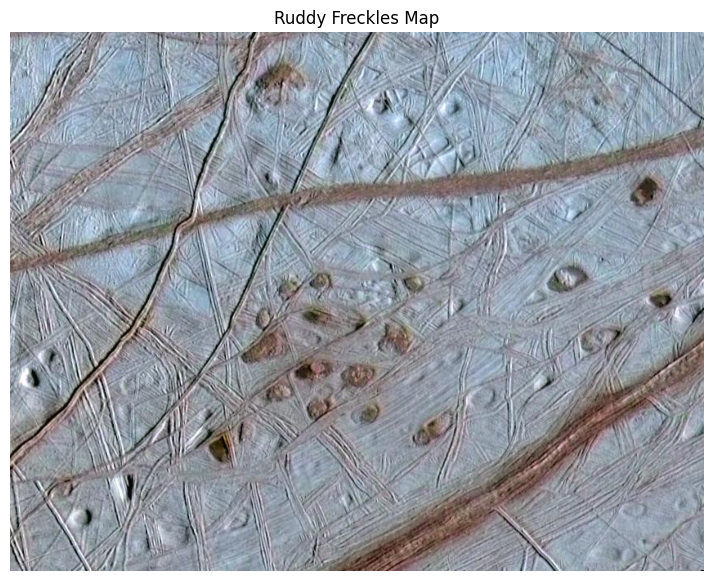

In [88]:
# Load image

# img_path = "/mnt/data/borvo_mensa.jpg"
img_path = r"europa_map\raw\ruddy_frackles.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
height, width, _ = img.shape

# Original Map
plt.figure(figsize=(12, 7))
plt.imshow(img_rgb)
plt.title("Ruddy Freckles Map")
plt.axis('off')
plt.show

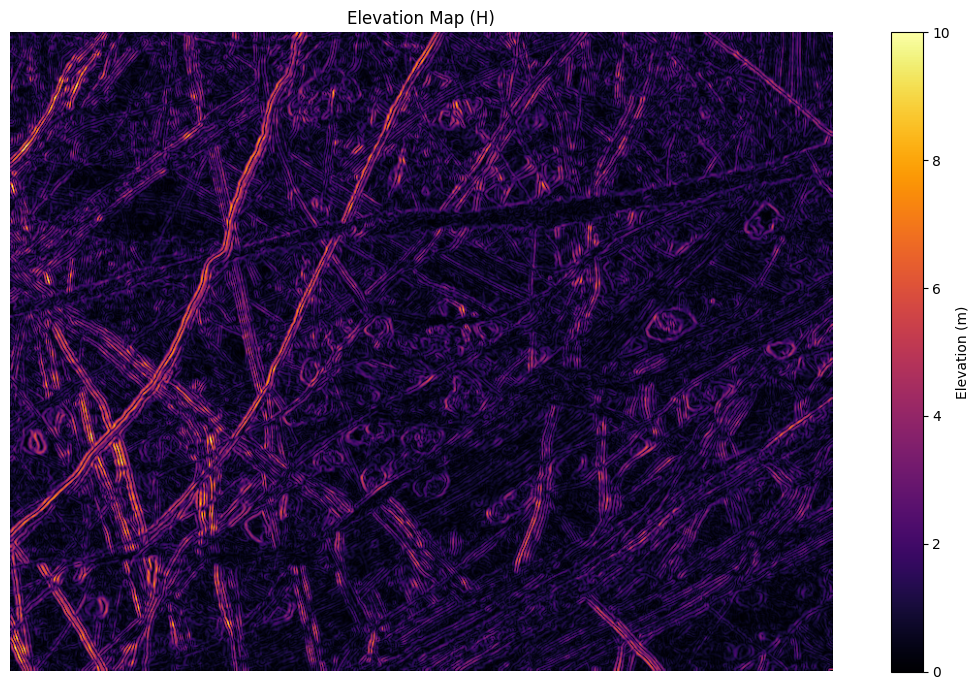

In [89]:
# Height (Elevation) Extraction

# Extract elevation (H) based on brightness
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Gradient-based pseudo-height map
sobelx = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=5)
sobely = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=5)
magnitude = np.sqrt(sobelx**2 + sobely**2)
H_map = cv2.normalize(magnitude, None, 0, 10, cv2.NORM_MINMAX)

plt.figure(figsize=(12, 7))
plt.imshow(H_map, cmap="inferno")
plt.colorbar(label="Elevation (m)")
plt.title("Elevation Map (H)")
plt.axis("off")
plt.tight_layout()
plt.show()

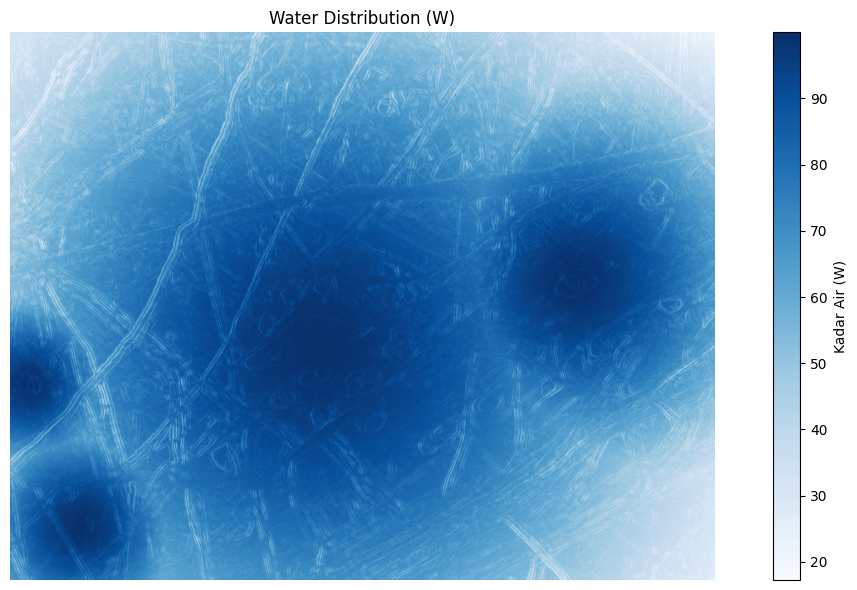

In [90]:
# Water sources
def pin_water(x, y, spread, H_factor):
    return (x, y, spread, H_factor)
def pin_water_pct(x_pct, y_pct, spread, H_factor):
    return (x_pct * width / 100, y_pct * height / 100, spread, H_factor)

waters = [
    pin_water(24, 423, 100, 5), pin_water(85, 594, 120, 5),
    pin_water(370, 375, 350, 20), pin_water(680, 300, 200, 12)
]

# Spread water on the map
def pour_water(center, Hmap, max_val=100, sigma=100, H_factor=30):
    y_idx, x_idx = np.indices(Hmap.shape)
    distance = np.sqrt((x_idx - center[0])**2 + (y_idx - center[1])**2)
    real_distance = distance + H_factor * Hmap

    decay = max_val * np.exp(-(real_distance**2) / (2 * sigma**2))        # Gaussian decay
    return decay

# Rebuild water map dengan baseline 10
W_map = np.full((height, width), 10.0)
for cx, cy, sprd, h in waters:
    radial = pour_water((cx, cy), H_map, max_val=100, sigma=sprd, H_factor=h)
    W_map = np.maximum(W_map, radial)

# Visualize water distribution map
plt.figure(figsize=(12, 6))
plt.imshow(W_map, cmap="Blues")
plt.colorbar(label="Kadar Air (W)")
plt.title("Water Distribution (W)")
plt.axis('off')
plt.tight_layout()
plt.show()


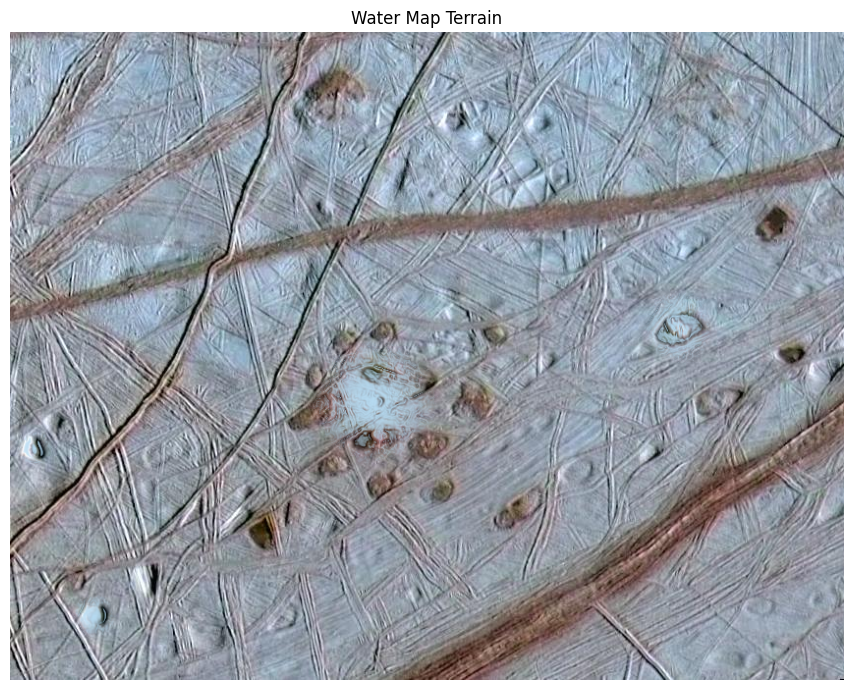

In [91]:
# Water Map Terrain

# Only W > 98 have alpha > 0 (displayed)
W_alpha = np.clip((W_map - 98) / 2, 0, 1)

# Blending to map
water_color = np.array([182, 219, 242]) / 255
blended = img_rgb / 255.0
for c in range(3):
    blended[:, :, c] = (1 - W_alpha) * blended[:, :, c] + W_alpha * water_color[c]

# Visualize watered map
plt.figure(figsize=(12, 7))
plt.imshow(blended)
plt.title("Water Map Terrain")
plt.axis('off')
plt.tight_layout()
plt.show()
# plt.savefig("first_waterMap.png", bbox_inches='tight', pad_inches=0, dpi=300)
# print("W_map max:", np.max(W_map))



In [92]:
# Gabungkan jadi DataFrame
rows = []
for i in range(height):
    for j in range(width):
        h = H_map[i, j]
        w = W_map[i, j]  # pastikan W_map sudah dihitung sebelum ini
        rows.append([i, j, h, w])

df_HW = pd.DataFrame(rows, columns=["i", "j", "H", "W"])
df_HW.to_csv(r"dataset\ruddy_HW_map.csv", index=False)


In [93]:
HFrame = pd.DataFrame(H_map)
HFrame

,0,1,2,3,4,5,6,7,8,9,...,839,840,841,842,843,844,845,846,847,848
0,0.000000,0.095936,0.231031,0.013705,0.172294,0.131178,0.321094,0.452272,0.232989,0.001958,...,0.064610,0.033284,0.650019,0.278020,0.622608,0.139010,0.268231,1.014186,1.625046,0.000000
1,0.313262,0.289377,0.241293,0.243460,0.357680,0.124630,0.334521,0.644108,0.432458,0.343440,...,0.468923,0.112982,0.652486,0.453810,0.588817,0.437484,0.134147,1.032686,1.368722,0.201662
2,0.550166,0.615194,0.360953,0.225985,0.224816,0.464168,0.420752,0.839503,0.944089,0.796882,...,0.875275,0.474286,0.594947,0.868390,0.635394,0.909254,0.643502,0.908941,0.750384,0.479682
3,0.446398,0.750484,0.654703,0.253276,0.439006,0.557486,0.590039,0.571019,1.177035,1.529375,...,1.010598,0.819423,0.620678,1.298291,0.842888,1.390525,1.350847,0.776314,0.619748,0.814481
4,0.366125,0.674084,1.000724,0.597231,0.804225,0.495607,0.615219,0.248744,1.031167,1.996193,...,0.842704,0.917729,0.548014,1.590945,1.083563,1.651105,2.024274,1.643509,1.650747,1.656373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
655,0.003916,0.202644,0.250031,0.380669,0.380239,0.215888,0.560662,0.299044,0.377687,1.272507,...,0.836887,1.120461,1.094357,0.452674,0.563506,1.149642,1.010878,0.571649,0.335299,0.070484
656,0.389620,0.576949,0.634889,0.538508,0.422425,0.081117,0.427039,0.103786,0.434933,0.813295,...,0.903756,1.178663,0.813262,0.352922,0.943826,0.731868,0.181889,0.241801,0.338125,0.285852
657,0.534503,0.794401,0.718627,0.469609,0.021890,0.328377,0.445971,0.079445,0.590296,0.879683,...,0.813950,0.952646,0.223662,0.962780,0.782944,0.822548,2.189466,2.758660,2.638386,2.486517
658,0.137052,0.657305,0.293125,0.425191,0.398749,0.358053,0.220560,0.194930,0.571892,0.870047,...,0.842001,0.781353,0.281735,1.172198,0.198008,2.671124,4.154453,4.767172,5.033380,5.029812


In [94]:
WFrame = pd.DataFrame(W_map)
WFrame

,0,1,2,3,4,5,6,7,8,9,...,839,840,841,842,843,844,845,846,847,848
0,32.214449,32.046115,31.770385,32.468331,32.125268,32.335943,31.906995,31.642011,32.343138,33.085719,...,23.513366,23.494661,21.955183,22.726784,21.836618,22.866595,22.469909,20.687927,19.286715,22.813904
1,31.450188,31.611772,31.840262,31.930834,31.712827,32.453663,31.968835,31.215931,31.890840,32.232855,...,22.728270,23.479799,22.118300,22.487045,22.082066,22.339480,22.955767,20.808004,19.986291,22.511708
2,30.902447,30.821754,31.609395,32.077528,32.177712,31.614643,31.829892,30.783404,30.595426,31.087407,...,21.955937,22.796090,22.421406,21.700792,22.143289,21.426920,21.939824,21.245962,21.511635,22.035993
3,31.280586,30.552843,30.906130,32.100549,31.685512,31.456936,31.463608,31.611354,30.067778,29.229051,...,21.814414,22.162860,22.532223,20.899110,21.834646,20.518926,20.517397,21.710204,21.974958,21.438487
4,31.596788,30.854480,30.072379,31.254160,30.788063,31.724252,31.492417,32.601469,30.553974,28.113081,...,22.370307,22.105270,22.874452,20.415894,21.453749,20.110556,19.230257,19.952030,19.848844,19.749071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
655,68.371665,68.280804,68.564206,68.639091,69.037042,69.837059,69.377606,70.411698,70.604531,68.782470,...,27.428799,26.613235,26.571528,28.077074,27.685330,26.118296,26.353003,27.338480,27.827317,28.394613
656,67.118851,67.053714,67.309964,67.948640,68.632690,69.868809,69.404217,70.587136,70.157046,69.607377,...,27.196128,26.406314,27.207827,28.267230,26.668101,27.088760,28.375297,28.111070,27.755723,27.779046
657,66.460364,66.211049,66.800278,67.818337,69.322174,68.953435,69.050409,70.339702,69.463093,69.129240,...,27.357111,26.902477,28.645061,26.664159,27.004658,26.798990,23.438346,22.068948,22.238723,22.479363
658,67.154792,66.252357,67.559221,67.623926,68.081425,68.571533,69.298138,69.744316,69.193977,68.835480,...,27.221780,27.266533,28.428678,26.085693,28.423427,22.394832,19.185403,17.910072,17.329998,17.256972


In [95]:
WFrame.describe()

,0,1,2,3,4,5,6,7,8,9,...,839,840,841,842,843,844,845,846,847,848
count,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,...,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000,660.000000
mean,60.647704,58.970656,58.882666,59.221198,59.345384,59.501845,59.596934,59.795177,60.186906,60.661994,...,48.104654,47.876634,47.694712,47.442450,47.209700,46.859368,46.789330,46.564364,46.516351,47.144983
std,19.524095,20.106097,20.268445,20.038867,20.031025,19.932554,19.913658,19.803365,19.747933,19.941164,...,14.916898,15.004203,14.941157,14.888003,14.784927,14.755646,14.780665,14.675459,14.634739,14.603779
min,26.976864,24.684082,20.526523,22.229897,25.209172,25.068026,24.649256,25.218505,25.498347,25.300577,...,21.814414,22.105270,21.955183,20.217028,21.060644,20.110556,19.185403,17.910072,17.329998,17.256972
25%,43.240691,41.809586,41.673262,41.675229,42.322622,42.381838,42.423600,43.019323,43.363685,43.754743,...,33.177535,32.669123,32.776967,32.921298,32.989930,32.789078,32.661216,32.600424,32.326254,33.020993
50%,57.029719,55.526503,54.899214,54.499738,55.576946,55.556128,54.862404,55.940434,55.431868,56.359459,...,48.858799,48.873251,48.074288,48.075776,48.357312,47.361819,46.985505,47.197334,47.088157,48.088784
75%,75.113495,74.083676,74.532779,74.129797,74.639125,74.625948,73.913288,73.788187,74.957271,76.696047,...,62.634579,62.687746,62.485765,62.054993,61.843536,61.296294,61.322565,61.002508,60.680513,61.407773
max,97.060952,96.982176,97.534210,97.589045,97.609195,97.755120,98.188125,98.175397,98.246008,98.428502,...,71.430458,72.135819,72.016421,71.334727,71.027003,71.017336,70.078650,69.476009,69.848629,69.983647


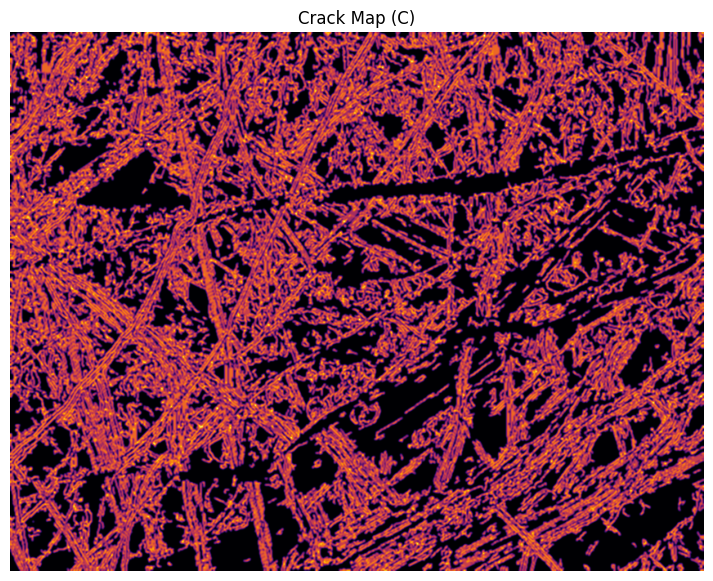

In [96]:
# Extract Ice Cracks

# Grayscale image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Crack map (C_map) -> Celah es
edges = cv2.Canny(gray, 100, 200)
C_blurred = cv2.GaussianBlur(edges.astype(np.float32), (5, 5), 0)
C_map = np.clip(C_blurred / C_blurred.max(), 0, 1)

# Crack Detection (Canny for cracks/celestial fissures)
edges = cv2.Canny(gray, threshold1=100, threshold2=200)

# Convert to crack severity (C_map)
blurred = cv2.GaussianBlur(edges.astype(np.float32), (5, 5), 0)
C_map = blurred / blurred.max()  # normalize to 0–1
C_map = np.clip(C_map, 0, 1)

# Plot
plt.figure(figsize=(12, 7))
plt.imshow(C_map, cmap='inferno')
plt.title("Crack Map (C)")
plt.axis('off')
plt.show()


<function matplotlib.pyplot.show(close=None, block=None)>

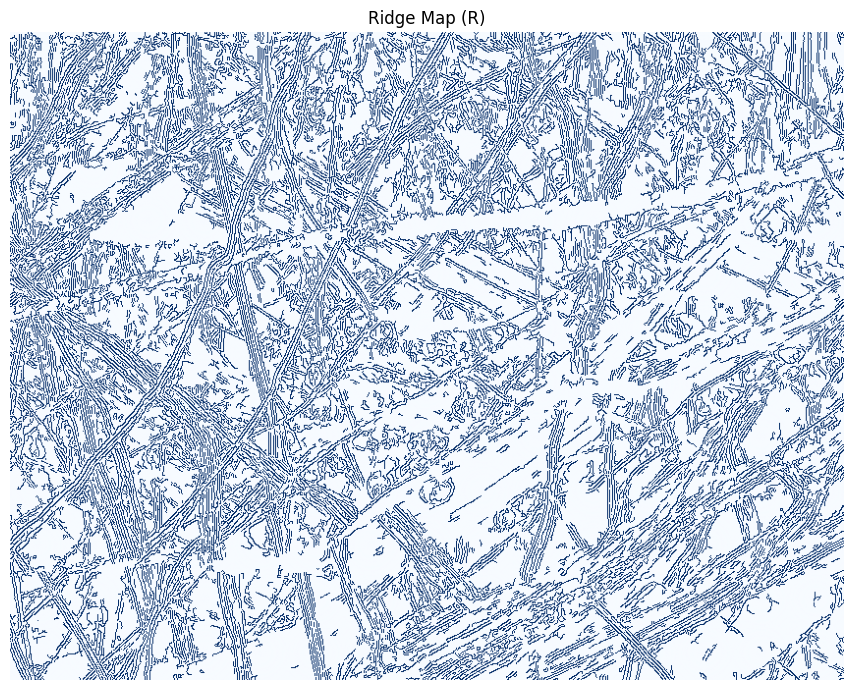

In [97]:
# Extract Ridges

# Resistance map (R_map) -> Ridges
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)
R_gradient = np.sqrt(sobelx**2 + sobely**2)
R_map = R_gradient / R_gradient.max()

resist_map = (R_map > 0.4).astype(np.uint8)
laplacian = cv2.Laplacian(gray, cv2.CV_64F)
resist_map = (np.abs(laplacian) > 45).astype(np.uint8)

edges = cv2.Canny(gray, 100, 200)
resist_map = (edges > 0).astype(np.uint8)
plt.figure(figsize=(10, 7))
plt.imshow(resist_map, cmap='Blues')
plt.title("Ridge Map (R)")
plt.axis('off')
plt.tight_layout()
plt.show

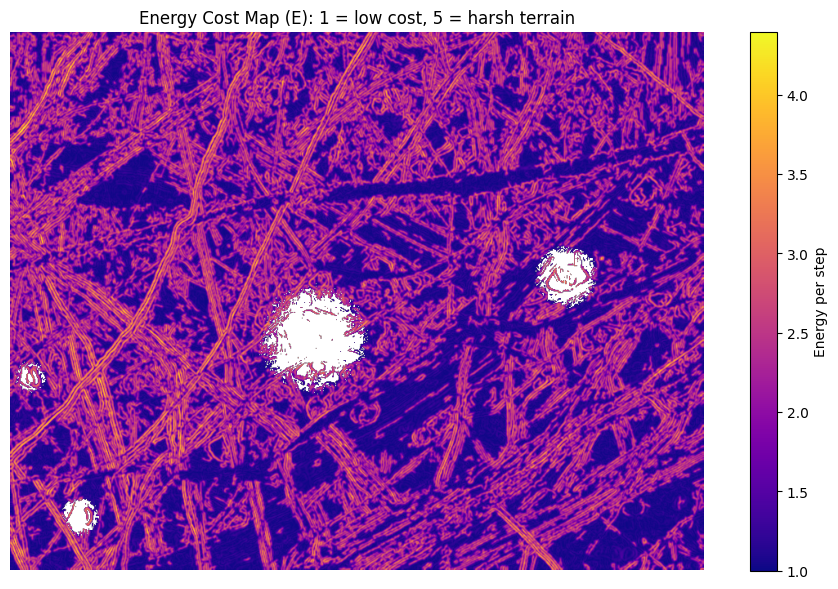

In [98]:
# Energy Consumption Map

# Compute E_map
E_map = 1 + 2 * R_map + 2 * C_map

E_map[W_map > 98] = np.nan  # block water areas
E_map = np.clip(E_map, 1, 5)

# Visualize E_map
plt.figure(figsize=(12, 7))
plt.imshow(E_map, cmap='plasma')
plt.title("Energy Cost Map (E): 1 = low cost, 5 = harsh terrain")
plt.colorbar(label='Energy per step')
plt.axis('off')
plt.show()


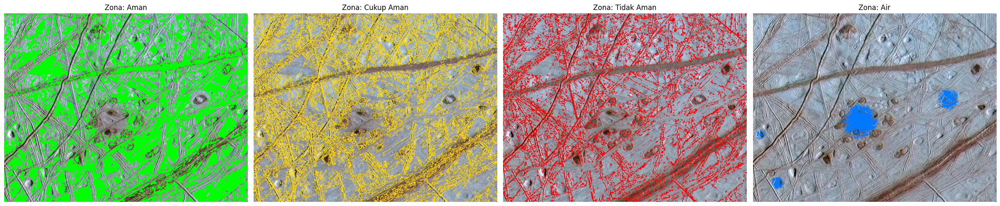

In [99]:
# Zone Map (Z)

Z_map = np.full((height, width), -1, dtype=int)

# Zona Air (kode: 3)
Z_map[W_map > 98] = 3

# Aman (kode: 0)
mask_aman = np.logical_and.reduce((
    W_map <= 98,
    R_map <= 0.35,
    C_map <= 0.3
))
Z_map[mask_aman] = 0

# Tidak Aman (kode: 2)
mask_bahaya = np.logical_and.reduce((
    W_map <= 98,
    np.logical_or(R_map > 0.6, C_map > 0.55)
))
Z_map[mask_bahaya] = 2

# Cukup Aman (kode: 1)
mask_cukup = np.logical_and.reduce((
    W_map <= 98,
    Z_map == -1  # semua yang belum terisi dan bukan zona air/bahaya
))
Z_map[mask_cukup] = 1

# Visualize Z_map
Z_labels = ['Aman', 'Cukup Aman', 'Tidak Aman', 'Air']
Z_colors = [
    [0, 255, 0],
    [255, 215, 0],
    [255, 0, 0],
    [0, 120, 255]
]

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
for z in range(4):
    Z_overlay = img_rgb.copy()
    mask = (Z_map == z)
    for c in range(3):
        Z_overlay[:, :, c] = np.where(mask, Z_colors[z][c], img_rgb[:, :, c])
    axes[z].imshow(Z_overlay)
    axes[z].set_title(f"Zona: {Z_labels[z]}")
    axes[z].axis('off')

plt.tight_layout()
plt.show()


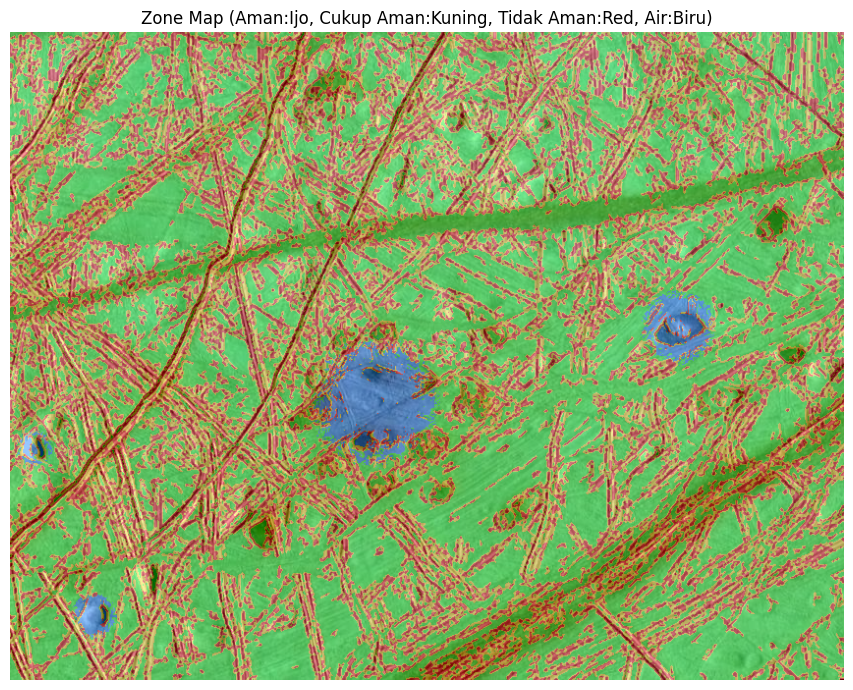

In [100]:
overlay_clr = {
    0: (0, 255, 0),      # Aman → Hijau
    1: (255, 215, 0),    # Cukup Aman → Kuning emas
    2: (255, 0, 0),      # Tidak Aman → Merah
    3: (0, 120, 255)     # Air → Biru terang
}

Z_mix = img_rgb.copy()
alpha = 0.4  # transparansi

# Terapkan overlay untuk setiap zona
for z, color in overlay_clr.items():
    mask = (Z_map == z)
    Z_layer = np.ones_like(img_rgb, dtype=np.uint8) * np.array(color, dtype=np.uint8)
    Z_mix[mask] = (
        alpha * Z_layer[mask] + (1 - alpha) * img_rgb[mask]
    ).astype(np.uint8)

# Tampilkan hasil gabungan
plt.figure(figsize=(12, 7))
plt.imshow(Z_mix)
plt.title("Zone Map (Aman:Ijo, Cukup Aman:Kuning, Tidak Aman:Red, Air:Biru)")
plt.axis('off')
plt.tight_layout()
plt.show()


In [101]:
ZFrame = pd.DataFrame(Z_map)
CFrame = pd.DataFrame(C_map)
RFrame = pd.DataFrame(R_map)
EFrame = pd.DataFrame(E_map)

ZFrame

,0,1,2,3,4,5,6,7,8,9,...,839,840,841,842,843,844,845,846,847,848
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,2,1,2,2,2,2
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,2,2,2,2,2,2
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,2,2,2,2,2,2
3,0,0,0,0,1,0,0,0,1,1,...,0,0,1,2,2,2,2,1,1,1
4,0,0,1,1,2,1,0,0,1,2,...,0,0,1,1,2,2,2,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
655,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,2,1,0,0
656,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,0
657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,1,1
658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,2,2,2,2


In [102]:
CFrame

,0,1,2,3,4,5,6,7,8,9,...,839,840,841,842,843,844,845,846,847,848
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010417,0.041667,0.072917,...,0.0,0.010417,0.114583,0.364583,0.552083,0.541667,0.583333,0.750000,0.791667,0.750000
1,0.000000,0.000000,0.005208,0.020833,0.031250,0.020833,0.005208,0.026042,0.104167,0.182292,...,0.0,0.026042,0.161458,0.411458,0.572917,0.552083,0.572917,0.708333,0.755208,0.729167
2,0.000000,0.000000,0.026042,0.104167,0.156250,0.104167,0.026042,0.057292,0.229167,0.401042,...,0.0,0.057292,0.255208,0.505208,0.625000,0.598958,0.552083,0.567708,0.609375,0.625000
3,0.010417,0.026042,0.109375,0.281250,0.369792,0.234375,0.057292,0.078125,0.312500,0.546875,...,0.0,0.078125,0.317708,0.562500,0.661458,0.671875,0.588542,0.463542,0.453125,0.489583
4,0.125000,0.182292,0.338542,0.531250,0.572917,0.364583,0.125000,0.109375,0.338542,0.583333,...,0.0,0.078125,0.317708,0.546875,0.630208,0.697917,0.703125,0.572917,0.494792,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
655,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026042,0.156250,...,0.0,0.000000,0.020833,0.114583,0.307292,0.536458,0.635417,0.479167,0.203125,0.072917
656,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005208,0.072917,...,0.0,0.000000,0.031250,0.145833,0.302083,0.401042,0.411458,0.328125,0.192708,0.125000
657,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026042,...,0.0,0.000000,0.020833,0.093750,0.197917,0.296875,0.375000,0.395833,0.364583,0.343750
658,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005208,...,0.0,0.000000,0.005208,0.041667,0.171875,0.411458,0.614583,0.651042,0.604167,0.583333


In [103]:
RFrame

,0,1,2,3,4,5,6,7,8,9,...,839,840,841,842,843,844,845,846,847,848
0,0.000000,0.009594,0.023103,0.001371,0.017229,0.013118,0.032109,0.045227,0.023299,0.000196,...,0.006461,0.003328,0.065002,0.027802,0.062261,0.013901,0.026823,0.101419,0.162505,0.000000
1,0.031326,0.028938,0.024129,0.024346,0.035768,0.012463,0.033452,0.064411,0.043246,0.034344,...,0.046892,0.011298,0.065249,0.045381,0.058882,0.043748,0.013415,0.103269,0.136872,0.020166
2,0.055017,0.061519,0.036095,0.022599,0.022482,0.046417,0.042075,0.083950,0.094409,0.079688,...,0.087528,0.047429,0.059495,0.086839,0.063539,0.090925,0.064350,0.090894,0.075038,0.047968
3,0.044640,0.075048,0.065470,0.025328,0.043901,0.055749,0.059004,0.057102,0.117703,0.152938,...,0.101060,0.081942,0.062068,0.129829,0.084289,0.139053,0.135085,0.077631,0.061975,0.081448
4,0.036612,0.067408,0.100072,0.059723,0.080422,0.049561,0.061522,0.024874,0.103117,0.199619,...,0.084270,0.091773,0.054801,0.159095,0.108356,0.165110,0.202427,0.164351,0.165075,0.165637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
655,0.000392,0.020264,0.025003,0.038067,0.038024,0.021589,0.056066,0.029904,0.037769,0.127251,...,0.083689,0.112046,0.109436,0.045267,0.056351,0.114964,0.101088,0.057165,0.033530,0.007048
656,0.038962,0.057695,0.063489,0.053851,0.042243,0.008112,0.042704,0.010379,0.043493,0.081330,...,0.090376,0.117866,0.081326,0.035292,0.094383,0.073187,0.018189,0.024180,0.033813,0.028585
657,0.053450,0.079440,0.071863,0.046961,0.002189,0.032838,0.044597,0.007945,0.059030,0.087968,...,0.081395,0.095265,0.022366,0.096278,0.078294,0.082255,0.218947,0.275866,0.263839,0.248652
658,0.013705,0.065731,0.029312,0.042519,0.039875,0.035805,0.022056,0.019493,0.057189,0.087005,...,0.084200,0.078135,0.028174,0.117220,0.019801,0.267112,0.415445,0.476717,0.503338,0.502981


In [104]:
EFrame

,0,1,2,3,4,5,6,7,8,9,...,839,840,841,842,843,844,845,846,847,848
0,1.000000,1.019187,1.046206,1.002741,1.034459,1.026236,1.064219,1.111288,1.129931,1.146225,...,1.012922,1.027490,1.359170,1.784771,2.228688,2.111135,2.220313,2.702837,2.908343,2.500000
1,1.062652,1.057875,1.058675,1.090359,1.134036,1.066593,1.077321,1.180905,1.294825,1.433271,...,1.093785,1.074680,1.453414,1.913679,2.263597,2.191663,2.172663,2.623204,2.784161,2.498666
2,1.110033,1.123039,1.124274,1.253530,1.357463,1.301167,1.136234,1.282484,1.647151,1.961460,...,1.175055,1.209441,1.629406,2.184095,2.377079,2.379767,2.232867,2.317205,2.368827,2.345936
3,1.110113,1.202180,1.349691,1.613155,1.827384,1.580247,1.232591,1.270454,1.860407,2.399625,...,1.202120,1.320135,1.759552,2.384658,2.491494,2.621855,2.447253,2.082346,2.030200,2.142063
4,1.323225,1.499400,1.877228,2.181946,2.306678,1.828288,1.373044,1.268499,1.883317,2.565905,...,1.168541,1.339796,1.745020,2.411939,2.477129,2.726054,2.811105,2.474535,2.319733,2.331275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
655,1.000783,1.040529,1.050006,1.076134,1.076048,1.043178,1.112132,1.059809,1.127621,1.567001,...,1.167377,1.224092,1.260538,1.319702,1.727285,2.302845,2.473009,2.072663,1.473310,1.159930
656,1.077924,1.115390,1.126978,1.107702,1.084485,1.016223,1.085408,1.020757,1.097403,1.308492,...,1.180751,1.235733,1.225152,1.362251,1.792932,1.948457,1.859294,1.704610,1.453042,1.307170
657,1.106901,1.158880,1.143725,1.093922,1.004378,1.065675,1.089194,1.015889,1.118059,1.228020,...,1.162790,1.190529,1.086399,1.380056,1.552422,1.758260,2.187893,2.343399,2.256844,2.184803
658,1.027410,1.131461,1.058625,1.085038,1.079750,1.071611,1.044112,1.038986,1.114378,1.184426,...,1.168400,1.156271,1.066764,1.317773,1.383352,2.357142,3.060057,3.255518,3.215009,3.172629
